Compare different clustering approach for WSI

In [14]:
%load_ext autoreload
%autoreload 2

import cv2
import h5py
import pandas as pd
import scanpy as sc 
import os
import ipdb
import openslide
import numpy as np
from tqdm import tqdm
import torch
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt
from torch_geometric.utils import to_networkx
import networkx as nx
import scanpy as sc
import spatialleiden as sl
import squidpy as sq
from sklearn.cluster import KMeans
from prototype_visualization_utils import get_panther_encoder, visualize_categorical_heatmap, get_mixture_plot, get_default_cmap

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
slide_id = "a194f77a-357f-11eb-a486-001a7dda7111"
wsi_dir = "/data1/r20user2/wsi_data/EBRAINS/WSIs"
wsi_path = os.path.join(wsi_dir, f"{slide_id}.ndpi")
graph_dir = "/data1/r20user2/wsi_data/EBRAINS/extracted_mag20x_patch256/uni_pt_patch_features/superpatch_graph"
# graph_dir = "/data1/r20user2/wsi_data/TCGA_NSCLC/extracted_mag20x_patch256/uni_pt_patch_features/WSI_graph"
# graph_dir = "/data1/r20user2/wsi_data/TCGA_NSCLC/extracted_mag20x_patch256/uni_pt_patch_features/superpatch_connected_graph"
graph_path = os.path.join(graph_dir, f"{slide_id}.pt")
h5_dir = "/data1/r20user2/wsi_data/EBRAINS/extracted_mag20x_patch256/uni_pt_patch_features/h5_files"
with h5py.File(os.path.join(h5_dir, f"{slide_id}.h5"), "r") as f:
    print(list(f.keys()))
    coords = f["coords"][:]
    features = f["features"][:]
pt_dir = "/data1/r20user2/wsi_data/EBRAINS/extracted_mag20x_patch256/uni_pt_patch_features/pt_files"
pt_path = os.path.join(pt_dir, f"{slide_id}.pt")
pt_data = torch.load(pt_path)
graph_data = torch.load(graph_path)
slide_prototype_dir = "/data1/r20user2/wsi_data/EBRAINS/extracted_mag20x_patch256/uni_pt_patch_features/cluster_feats"
slide_prototype_path = os.path.join(slide_prototype_dir, f"{slide_id}.h5ad")
slide_prototype = sc.read_h5ad(slide_prototype_path)

['coords', 'features']


/tmp/ipykernel_1031777/4255809327.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pt_data = torch.load(pt_path)
/tmp/ipykernel_1031777/4255809327.py:16: FutureWarning: 

In [3]:
seed = 42

adata = sc.AnnData(features)
adata.obsm["spatial"] = coords

sc.pp.pca(adata, n_comps=64, random_state=seed)
sc.pp.neighbors(adata, random_state=seed)
sq.gr.spatial_neighbors(adata, coord_type="generic", n_neighs=8)
adata.obsp["spatial_connectivities"] = sl.distance2connectivity(
    adata.obsp["spatial_distances"]
)
sc.tl.leiden(adata, directed=False, random_state=seed)
sl.spatialleiden(adata, layer_ratio=1.8, directed=(False, True), seed=seed)

/tmp/ipykernel_1031777/2149673290.py:12: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, directed=False, random_state=seed)


In [15]:
kmeans = KMeans(n_clusters=13, random_state=seed)
kmeans.fit(adata.obsm["X_pca"])
kmeans_labels = kmeans.labels_

vis_level: 3
6656 6752
8.0


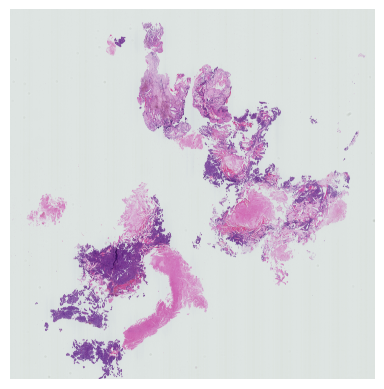

In [23]:
# plot topk subbgraphs and whole WSI
wsi = openslide.open_slide(wsi_path)
downscale = 8
vis_level = wsi.get_best_level_for_downsample(downscale)
print(f"vis_level: {vis_level}")
w, h = wsi.level_dimensions[vis_level]
print(w, h)
downsamples = wsi.level_downsamples[vis_level]
print(downsamples)

patch_size = 512
vis_patch_size = int(patch_size / downsamples)
whole_wsi = np.array(wsi.read_region((0, 0), level=vis_level, size=(w, h)).convert("RGB"))
plt.imshow(whole_wsi)
plt.axis("off")
plt.savefig(f"WSI_{slide_id}.pdf", bbox_inches="tight")


Creating heatmap for: 
Top Left:  (0, 0) Bottom Right:  (53248, 54016)
Width: 1664, Height: 1688
Original Patch Size / Scaled Patch Size: (512, 512) / [16 16]
vis_level:  5
downsample:  32
region_size:  (1664, 1688)
total of 2528 patches


100%|██████████| 2528/2528 [00:00<00:00, 12858.46it/s]


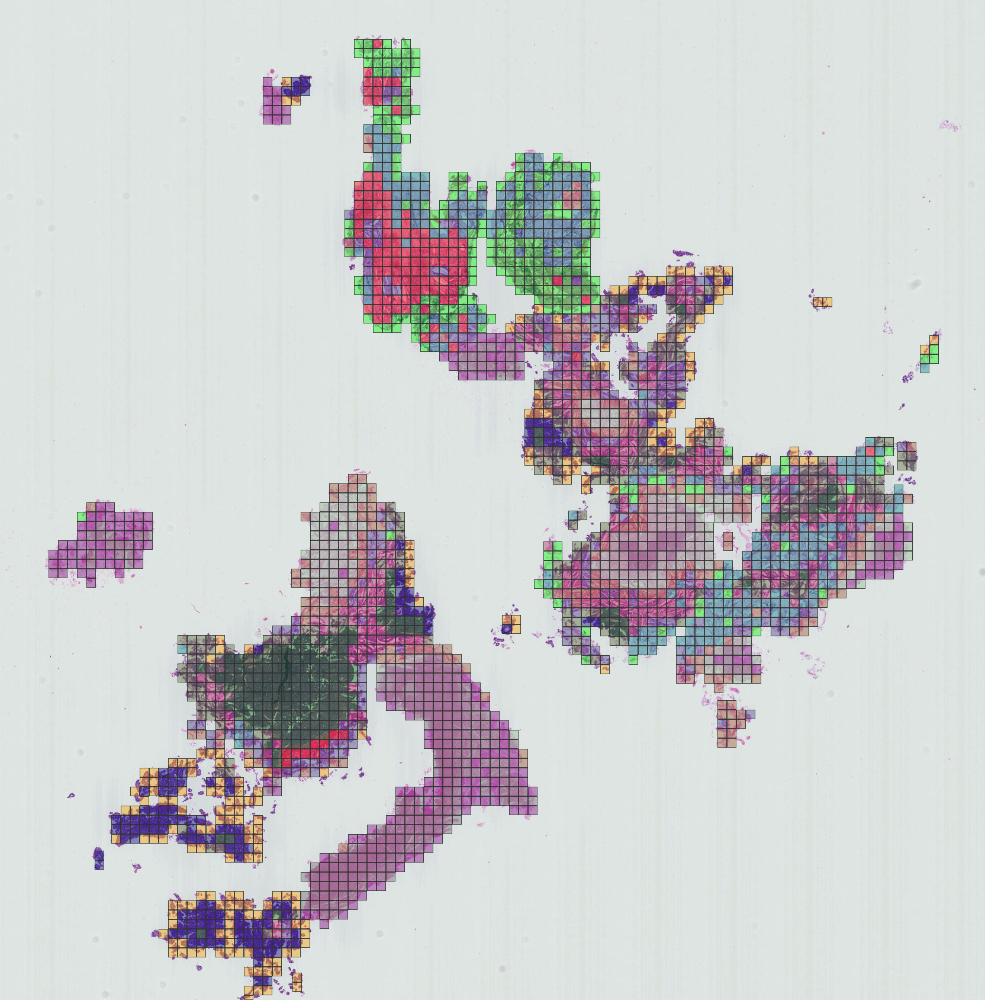

In [16]:
### Visualize the categorical heatmap and the GMM mixtures
cat_map = visualize_categorical_heatmap(
    wsi,
    coords, 
    kmeans_labels, 
    label2color_dict=get_default_cmap(16),
    vis_level=wsi.get_best_level_for_downsample(32),
    patch_size=(patch_size, patch_size),
    alpha=0.4,
)

resized_cat_map = cat_map.resize((cat_map.width, cat_map.height))
resized_cat_map.save(f"KMeans_{slide_id}.pdf")
display(resized_cat_map)


Creating heatmap for: 
Top Left:  (0, 0) Bottom Right:  (53248, 54016)
Width: 1664, Height: 1688
Original Patch Size / Scaled Patch Size: (512, 512) / [16 16]
vis_level:  5
downsample:  32
region_size:  (1664, 1688)
total of 2528 patches


100%|██████████| 2528/2528 [00:00<00:00, 13533.21it/s]


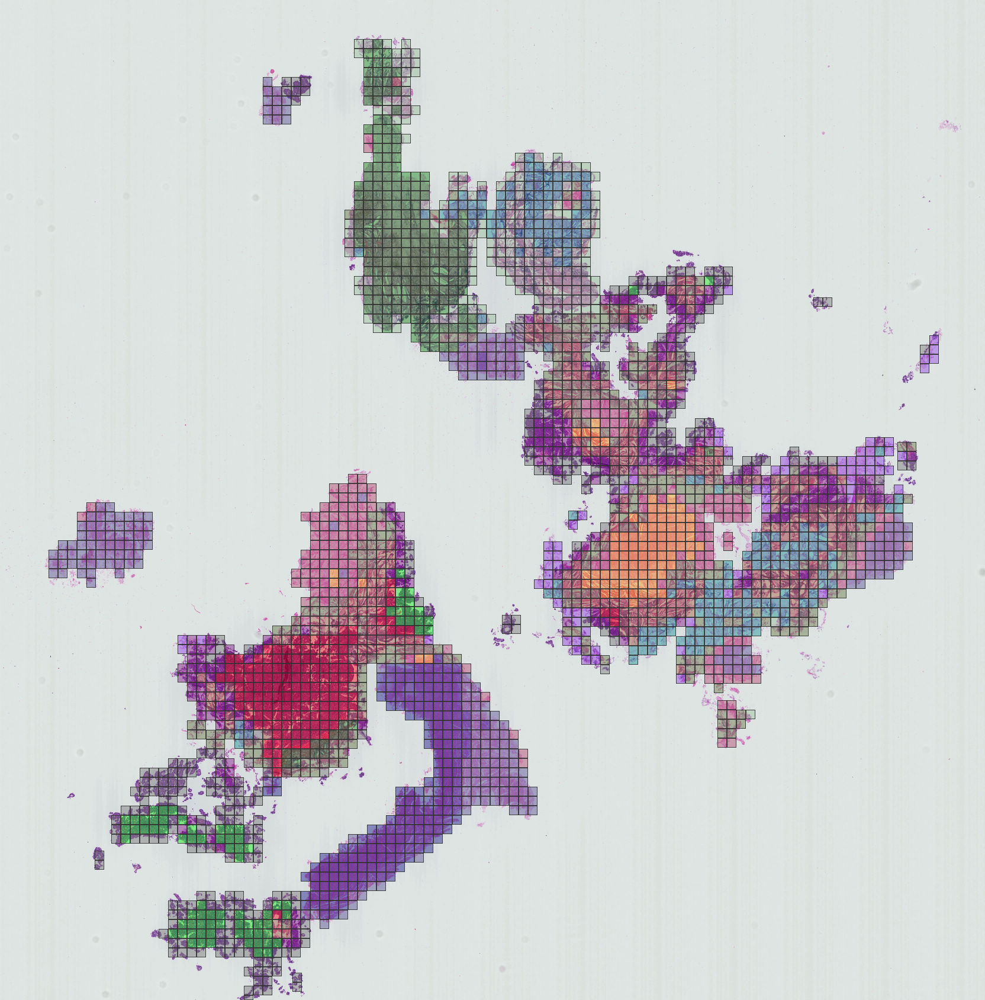

In [17]:
### Visualize the categorical heatmap and the GMM mixtures
cat_map = visualize_categorical_heatmap(
    wsi,
    coords, 
    adata.obs["leiden"].to_numpy().astype(int), 
    label2color_dict=get_default_cmap(16),
    vis_level=wsi.get_best_level_for_downsample(32),
    patch_size=(patch_size, patch_size),
    alpha=0.4,
)

resized_cat_map = cat_map.resize((cat_map.width, cat_map.height))
resized_cat_map.save(f"Leiden_cluster_{slide_id}.pdf")
display(resized_cat_map)


Creating heatmap for: 
Top Left:  (0, 0) Bottom Right:  (53248, 54016)
Width: 1664, Height: 1688
Original Patch Size / Scaled Patch Size: (512, 512) / [16 16]
vis_level:  5
downsample:  32
region_size:  (1664, 1688)
total of 2528 patches


100%|██████████| 2528/2528 [00:00<00:00, 12308.46it/s]


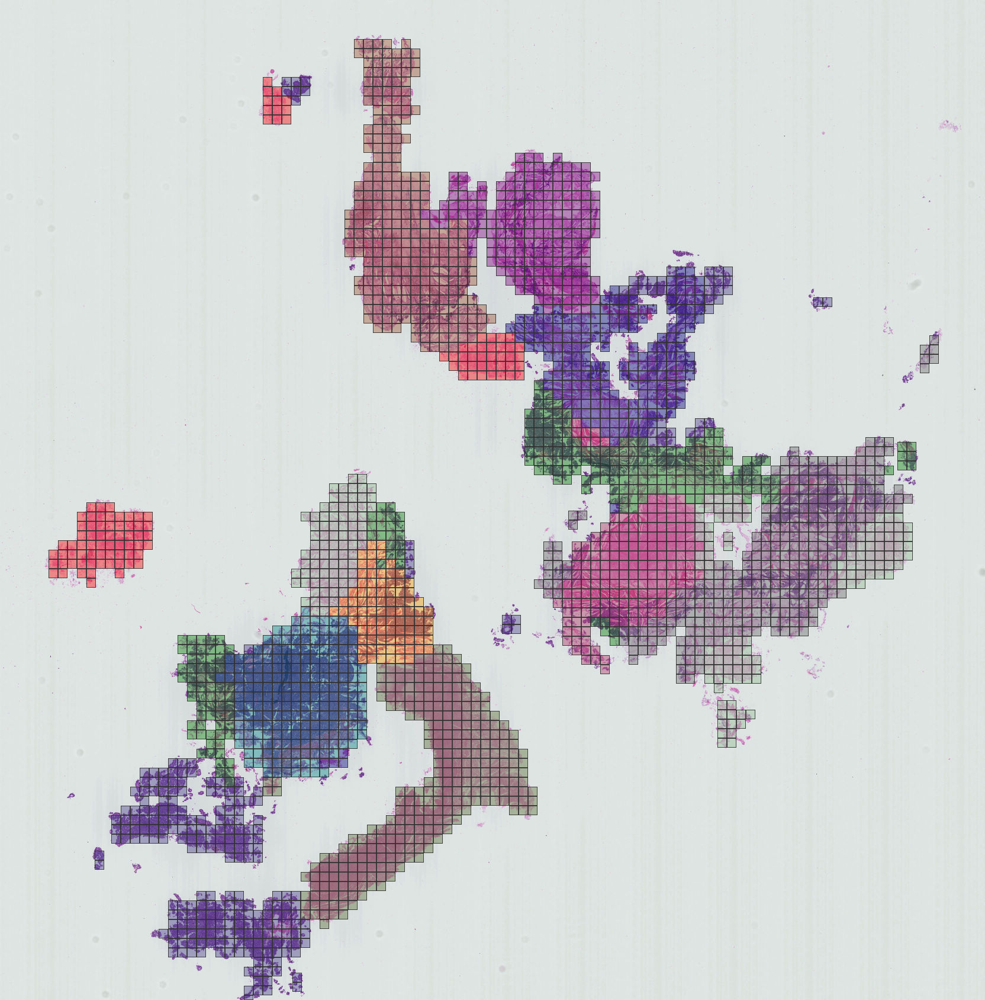

In [18]:
### Visualize the categorical heatmap and the GMM mixtures
cat_map = visualize_categorical_heatmap(
    wsi,
    coords, 
    adata.obs["spatialleiden"].to_numpy().astype(int), 
    label2color_dict=get_default_cmap(16),
    vis_level=wsi.get_best_level_for_downsample(32),
    patch_size=(patch_size, patch_size),
    alpha=0.4,
)

resized_cat_map = cat_map.resize((cat_map.width, cat_map.height))
resized_cat_map.save(f"Spatial_Leiden_cluster_{slide_id}.pdf")
display(resized_cat_map)

In [ ]:
# leiden_cluster_img = np.zeros_like(whole_wsi)
# for (coord, cluster) in zip(adata.obsm["spatial"], adata.obs["leiden"]):
#     vis_coord = (int(coord[0] * 512 / downsamples), int(coord[1] * 512 / downsamples))
#     leiden_cluster_img[
#         vis_coord[1] : vis_coord[1] + vis_patch_size,
#         vis_coord[0] : vis_coord[0] + vis_patch_size,
#     ] = float(cluster)

# leiden_cluster_img = leiden_cluster_img.astype(np.float32)
# leiden_cluster_img = (leiden_cluster_img - leiden_cluster_img.min()) / (leiden_cluster_img.max() - leiden_cluster_img.min())
# leiden_cluster_img = np.uint8(leiden_cluster_img * 255)
# leiden_cluster_img = cv2.applyColorMap(leiden_cluster_img, cv2.COLORMAP_JET)
# leiden_cluster_img = cv2.addWeighted(whole_wsi, 0.5, leiden_cluster_img, 0.5, 0)

# # for coord in coords:
# #     vis_coord = (int(coord[0] * 512 / downsamples), int(coord[1] * 512 / downsamples))
# #     cv2.circle(leiden_cluster_img, vis_coord, 1, (0, 0, 255), -1)

# # spatial_cluster_img = np.zeros_like(whole_wsi)
# # for (coord, cluster) in zip(adata.obsm["spatial"], adata.obs["spatialleiden"]):
# #     vis_coord = (int(coord[0] / downsamples), int(coord[1] / downsamples))
# #     spatial_cluster_img[
# #         vis_coord[1] : vis_coord[1] + vis_patch_size,
# #         vis_coord[0] : vis_coord[0] + vis_patch_size,
# #     ] = cluster